# AIPI 590 - XAI | Assignment #7
### Using Saliency Maps for explaining deep neural networks
### Ritu Toshniwal

[![Open In Collab](https://colab.research.google.com/assets/colab-badge.svg)](https://colab.research.google.com/github/ritu1412/SHAP-Interpretability/blob/main/notebooks/saliency_maps.ipynb)

In [ ]:
import os

# Remove Colab default sample_data
!rm -r ./sample_data

# Clone GitHub files to colab workspace
repo_name = "SHAP-Interpretability"
git_path = 'https://github.com/ritu1412/SHAP-Interpretability.git' #Change to your path
!git clone "{git_path}"

# Change working directory to location of notebook
notebook_dir = 'notebooks'
path_to_notebook = os.path.join(repo_name,notebook_dir)
%cd "{path_to_notebook}"
%ls

# Saliency Maps 🖼️

Pixel attribution highlights the pixels relevant to an image classification by a neural network. Visualizations via the vanilla gradient are also known as saliency maps.

### How does it work?
Calculate the gradient of the loss function for the class of interest with respect to the input pixels

Process:
1. Perform a forward pass of image of interest
2. Compute the gradient of the class score of interest with respect to the input pixels (set all other classes to zero)
3. Visualize the gradients (show absolute values or highlight negative and positive contributions)


In [1]:
!pip install numpy==1.25.2 matplotlib==3.7.1 tensorflow==2.14.1

  Using cached absl_py-2.1.0-py3-none-any.whl.metadata (2.3 kB)
  Using cached ml_dtypes-0.2.0-cp39-cp39-macosx_10_9_universal2.whl.metadata (20 kB)
  Using cached google_auth-2.35.0-py2.py3-none-any.whl.metadata (4.7 kB)
  Using cached tensorboard_data_server-0.7.2-py3-none-any.whl.metadata (1.1 kB)
  Using cached werkzeug-3.0.4-py3-none-any.whl.metadata (3.7 kB)
  Using cached cachetools-5.5.0-py3-none-any.whl.metadata (5.3 kB)
  Using cached pyasn1_modules-0.4.1-py3-none-any.whl.metadata (3.5 kB)
  Using cached rsa-4.9-py3-none-any.whl.metadata (4.2 kB)
  Using cached requests_oauthlib-2.0.0-py2.py3-none-any.whl.metadata (11 kB)
  Using cached pyasn1-0.6.1-py3-none-any.whl.metadata (8.4 kB)
  Using cached oauthlib-3.2.2-py3-none-any.whl.metadata (7.5 kB)
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 14.0/14.0 MB 30.5 MB/s eta 0:00:00a 0:00:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 7.3/7.3 MB 47.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 199.7/199.7 MB 21.4 MB/

In [1]:
# Importing necessary libraries
import numpy as np
import matplotlib.pyplot as plt
import tensorflow as tf
from tensorflow.keras.preprocessing import image
from tensorflow.keras.applications.resnet50 import ResNet50, preprocess_input, decode_predictions
from keras.utils import get_file
import json
import os

/Users/ritutoshniwal/Code/SHAP/env/lib/python3.9/site-packages/urllib3/__init__.py:35: NotOpenSSLWarning: urllib3 v2 only supports OpenSSL 1.1.1+, currently the 'ssl' module is compiled with 'LibreSSL 2.8.3'. See: https://github.com/urllib3/urllib3/issues/3020
  warnings.warn(


#### Tensorflow Terminology: gradient tape

A **gradient tape** is a TensorFlow mechanism for automatic differentiation. We use it to record operations for which we want to compute gradients, typically within the context of training a neural network. When we perform operations inside a tf.GradientTape() context, TensorFlow keeps track of all the computations that occur on tensors that are "watched" by the tape.

Here gradient tape is used to compute the gradients of the model's predictions with respect to the input image tensor.

In [2]:
# Function to generate a saliency map for an input image based on a given model

def generate_saliency_map(model, img):
    # Convert the input image to a TensorFlow variable
    x = tf.Variable(img)

    # Add an extra dimension to the image tensor to match the model's input shape
    x = tf.expand_dims(x, axis=0)

    # Preprocess the image according to ResNet50 requirements
    x = tf.keras.applications.resnet50.preprocess_input(x)

    # Create a gradient tape context to record operations for automatic differentiation
    with tf.GradientTape() as tape:
        # Watch the input tensor to calculate gradients
        tape.watch(x)

        # Forward pass: get model predictions for the input image
        preds = model(x)

        # Find the index of the highest predicted class probability
        top_pred_index = tf.argmax(preds[0])

    # Calculate the gradients of the top prediction with respect to the input image
    grads = tape.gradient(preds, x)

    # Compute the saliency map by taking the maximum absolute gradient across color channels
    saliency = tf.reduce_max(tf.abs(grads), axis=-1)[0]

    # Return the saliency map and the index of the top predicted class as a numpy array
    return saliency, top_pred_index.numpy()


In [3]:
# Load the pre-trained ResNet50 model
model = ResNet50(weights='imagenet')

In [4]:
# Load ImageNet class labels
class_index_path = get_file('imagenet_class_index.json', 'https://storage.googleapis.com/download.tensorflow.org/data/imagenet_class_index.json')
with open(class_index_path) as f:
    class_idx = json.load(f)

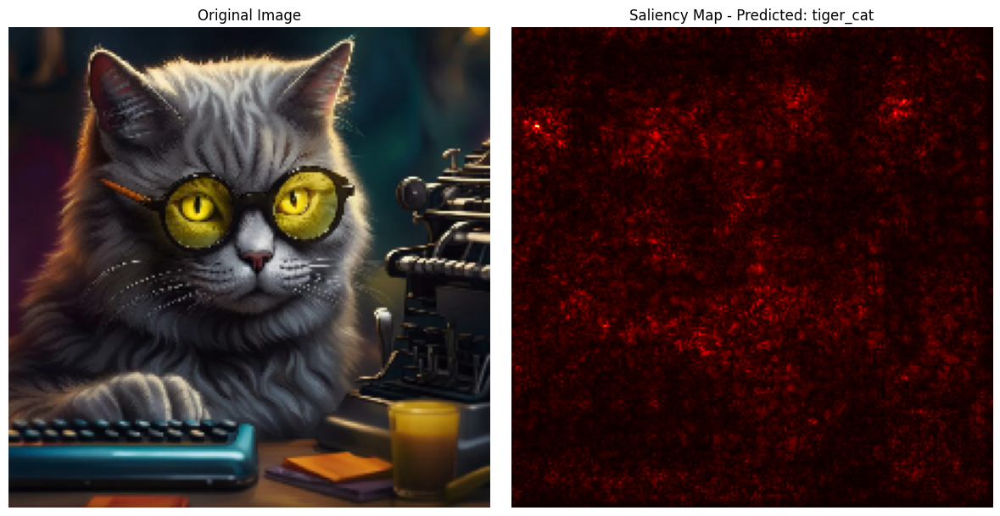

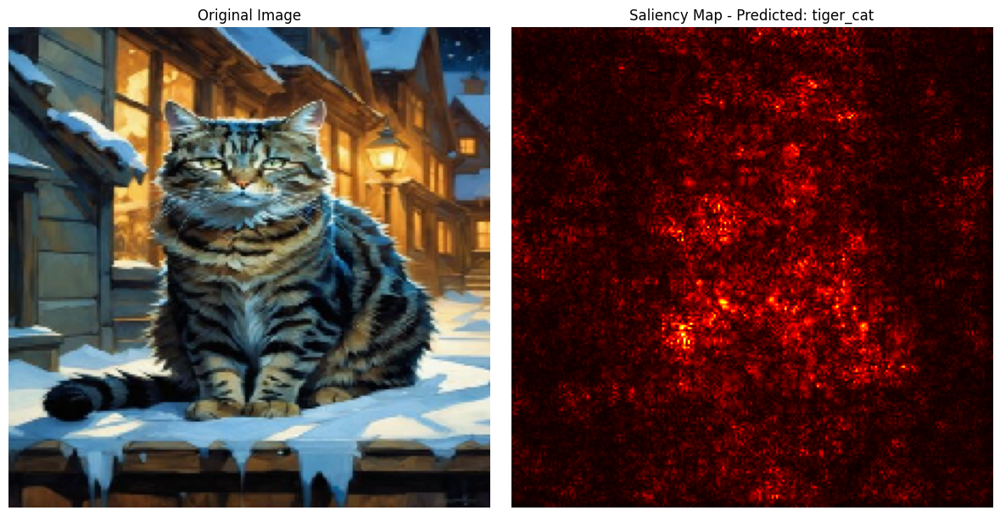

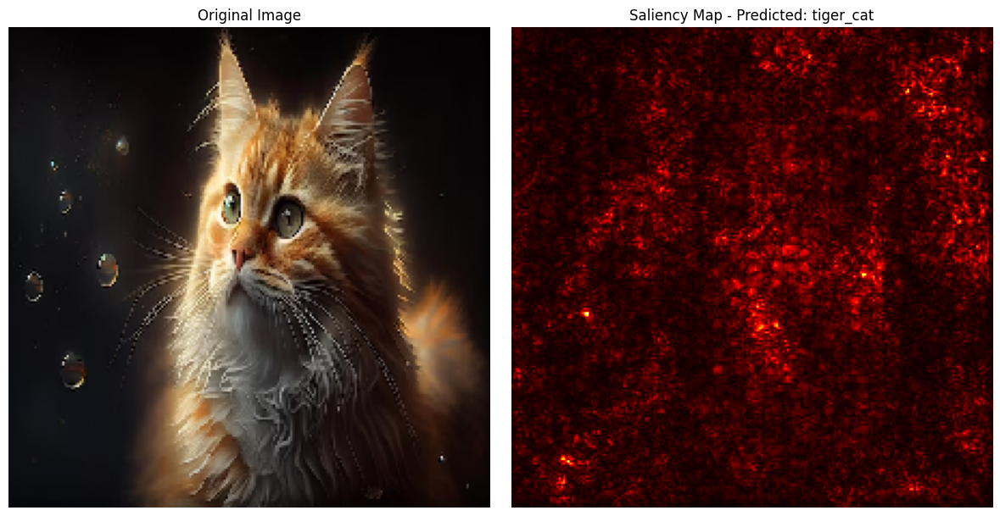

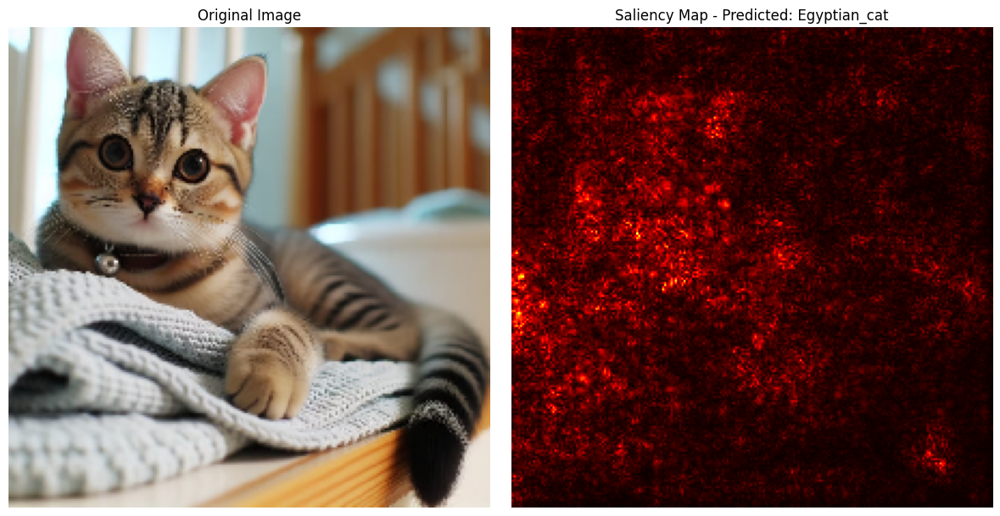

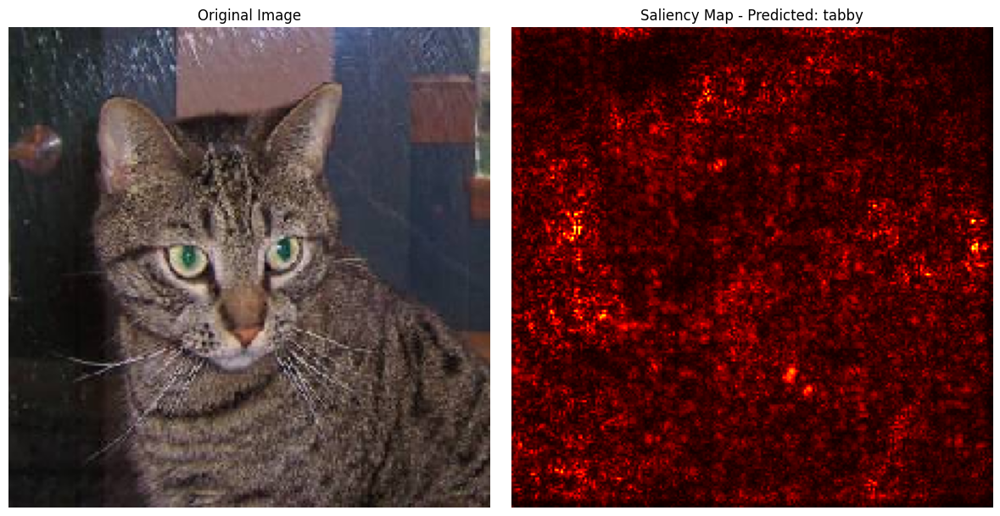

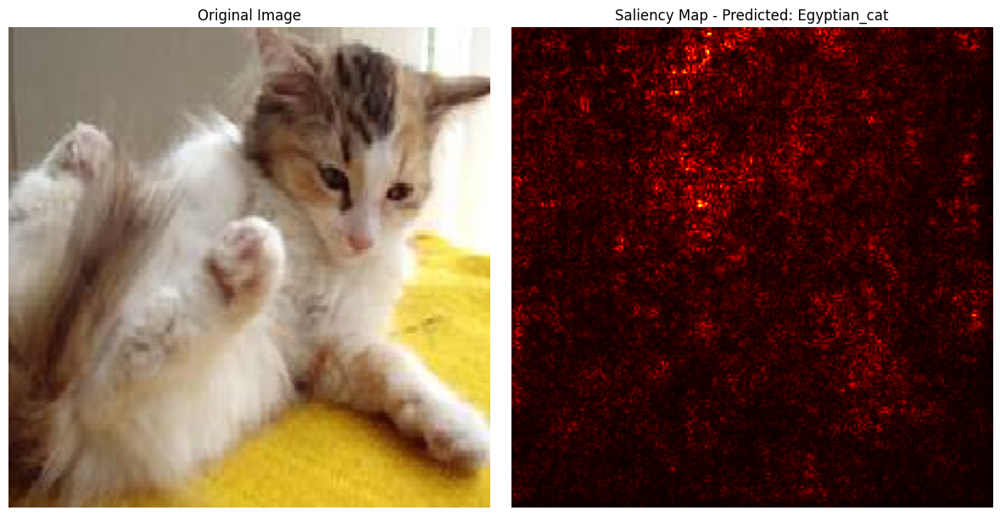

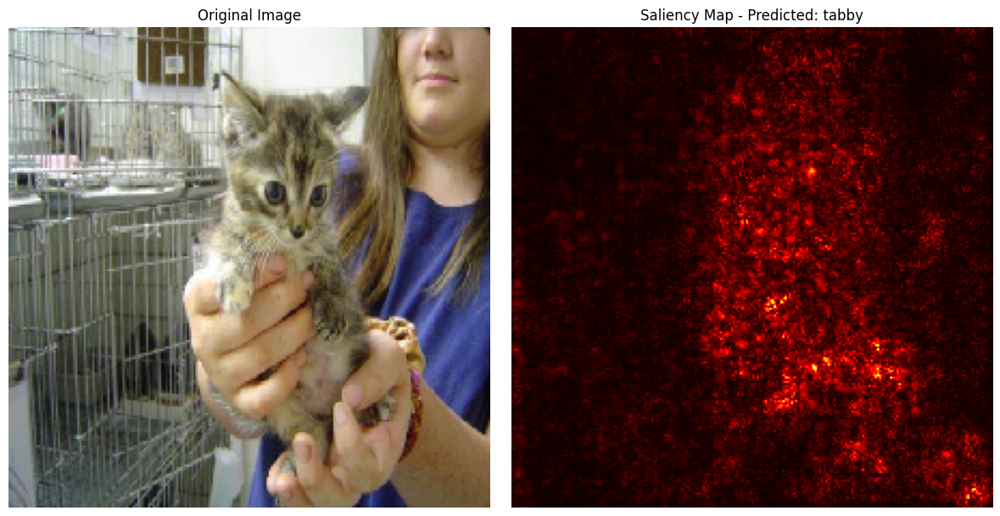

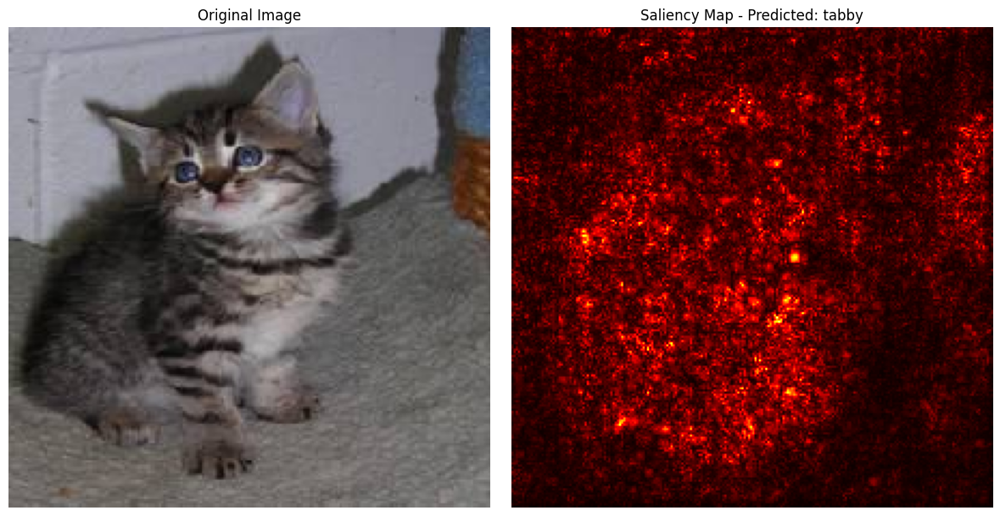

In [15]:
img_dir = '../data'
# Get a list of image files
image_files = [f for f in sorted(os.listdir(img_dir)) if f.lower().endswith(('.jpg', '.jpeg', '.png', '.webp'))]

# Loop through each image file in the directory
for img_file in image_files:
    img_path = os.path.join(img_dir, img_file)

    # Load and preprocess the image
    img = image.load_img(img_path, target_size=(224, 224))
    img_array = image.img_to_array(img)

    # Generate saliency map
    saliency_map, top_pred_index = generate_saliency_map(model, img_array)
    predicted_class = class_idx[str(top_pred_index)][1]

    # Normalize saliency map for better visualization
    saliency_map = (saliency_map - tf.reduce_min(saliency_map)) / (tf.reduce_max(saliency_map) - tf.reduce_min(saliency_map) + 1e-10)

    # Create a figure with 1 row and 2 columns
    fig, axes = plt.subplots(nrows=1, ncols=2, figsize=(12, 6))

    # Display the original image
    axes[0].imshow(img_array.astype(np.uint8))
    axes[0].set_title("Original Image")
    axes[0].axis('off')

    # Display the saliency map alone
    axes[1].imshow(saliency_map, cmap='hot')
    axes[1].set_title(f"Saliency Map - Predicted: {predicted_class}")
    axes[1].axis('off')

    # Adjust layout and show the plot
    plt.tight_layout()
    plt.show()

Just to get a clearer picture overlaying the map to original image

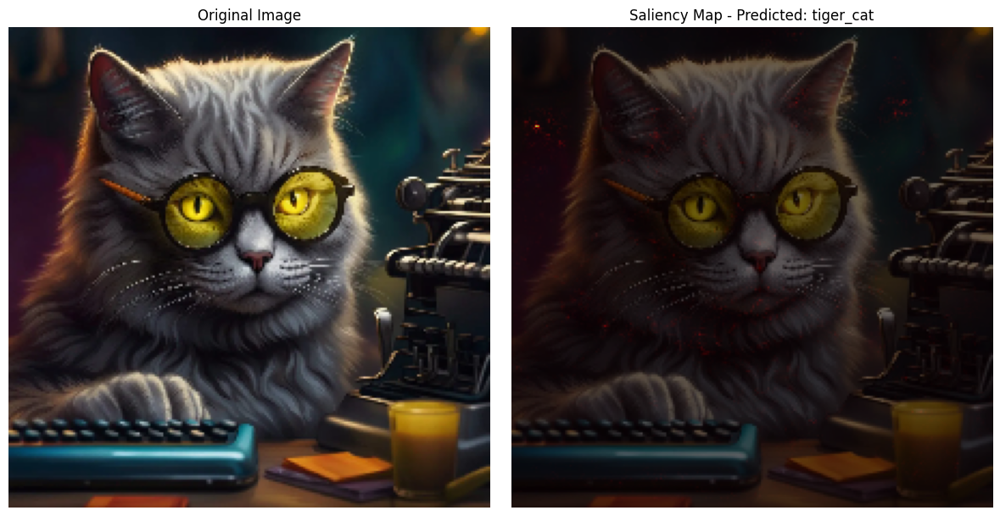

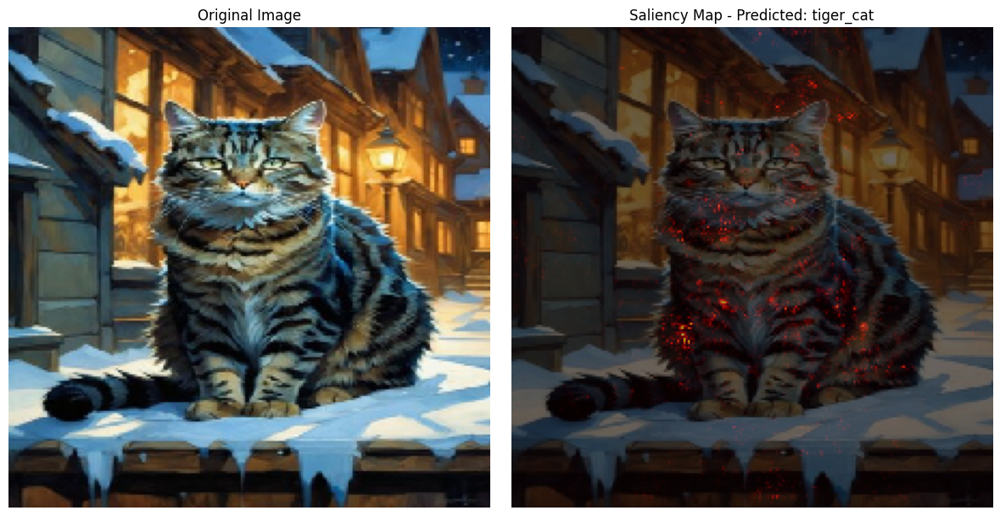

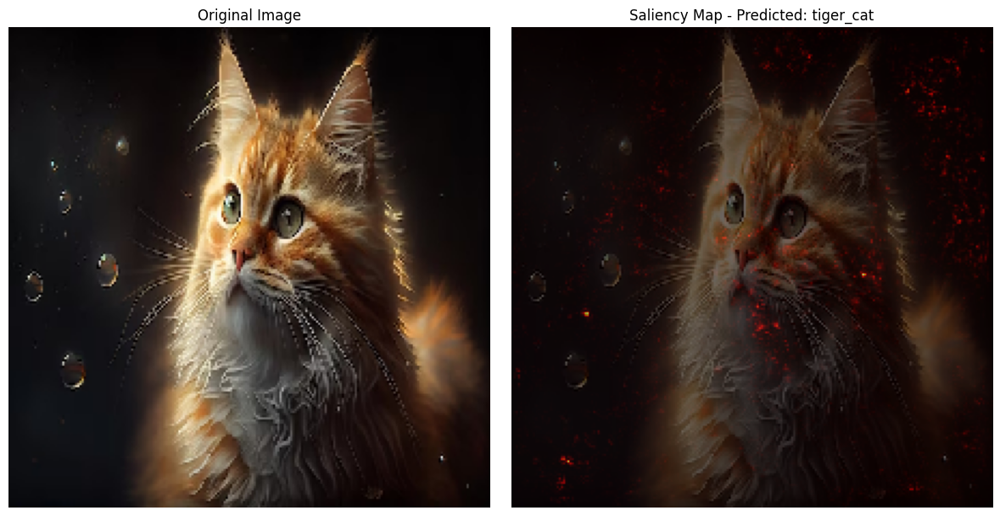

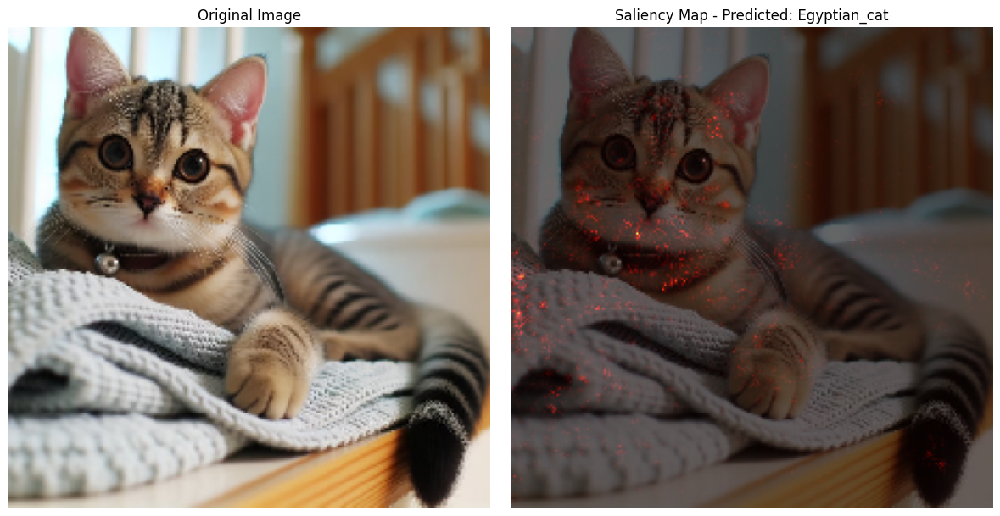

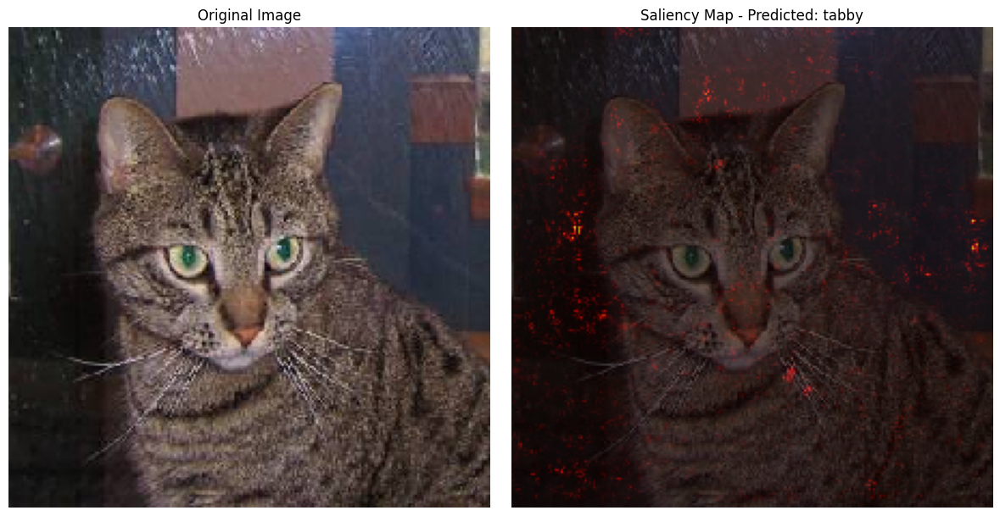

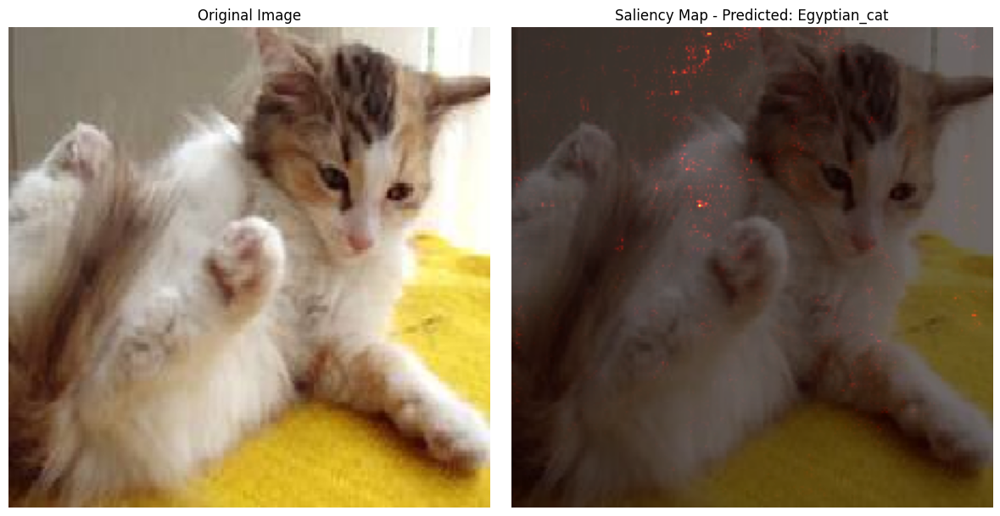

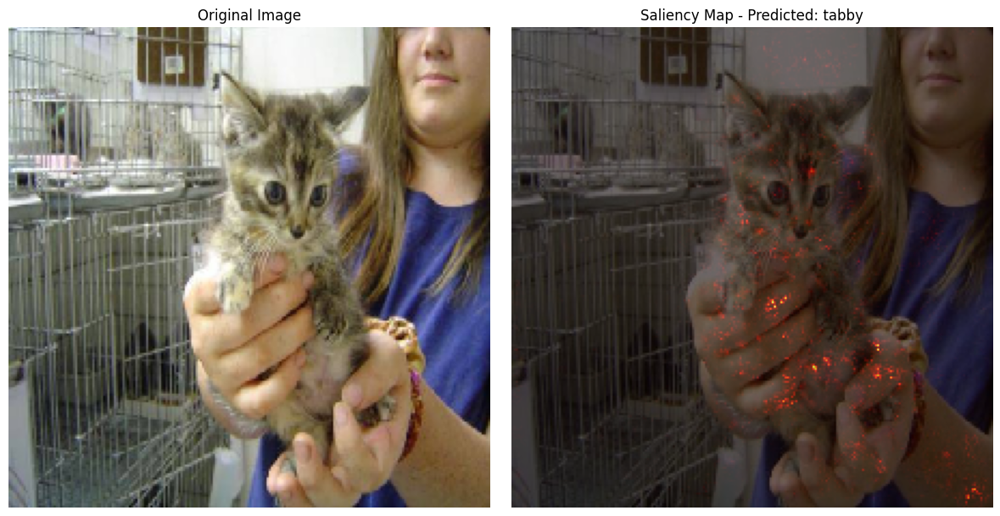

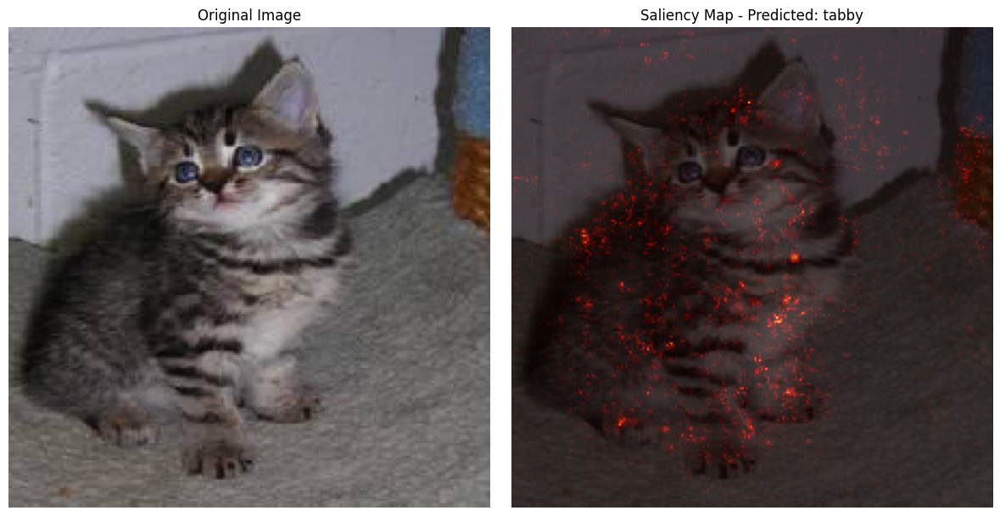

In [13]:
# Define the directory containing images
img_dir = '../data'  # Replace with the path to your 'data' directory

# Get a list of image files
image_files = [f for f in sorted(os.listdir(img_dir)) if f.lower().endswith(('.jpg', '.jpeg', '.png', '.webp'))]

# Loop through each image file in the directory
for img_file in image_files:
    img_path = os.path.join(img_dir, img_file)

    # Load and preprocess the image
    img = image.load_img(img_path, target_size=(224, 224))
    img_array = image.img_to_array(img)

    # Generate saliency map
    saliency_map, top_pred_index = generate_saliency_map(model, img_array)
    predicted_class = class_idx[str(top_pred_index)][1]

    # Normalize and enhance saliency map for better visualization
    saliency_map = (saliency_map - tf.reduce_min(saliency_map)) / (tf.reduce_max(saliency_map) - tf.reduce_min(saliency_map) + 1e-10)
    saliency_map = tf.pow(saliency_map, 2)

    # Create a figure with 1 row and 2 columns
    fig, axes = plt.subplots(nrows=1, ncols=2, figsize=(12, 6))

    # Display the original image
    axes[0].imshow(img_array.astype(np.uint8))
    axes[0].set_title("Original Image")
    axes[0].axis('off')

    # Display the saliency map overlay
    axes[1].imshow(img_array.astype(np.uint8))
    axes[1].imshow(saliency_map, cmap='hot', alpha=0.6)
    axes[1].set_title(f"Saliency Map - Predicted: {predicted_class}")
    axes[1].axis('off')

    # Adjust layout and show the plot
    plt.tight_layout()
    plt.show()
